In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,20)

X_train Shape : (12028, 20, 1)
y_train Shape : (12028, 1)
X_test Shape :  (3013, 20, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [22]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 18ms/step - loss: 0.0140 - val_loss: 0.0047
Epoch 2/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0031 - val_loss: 0.0039
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0024 - val_loss: 0.0035
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 6/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_l

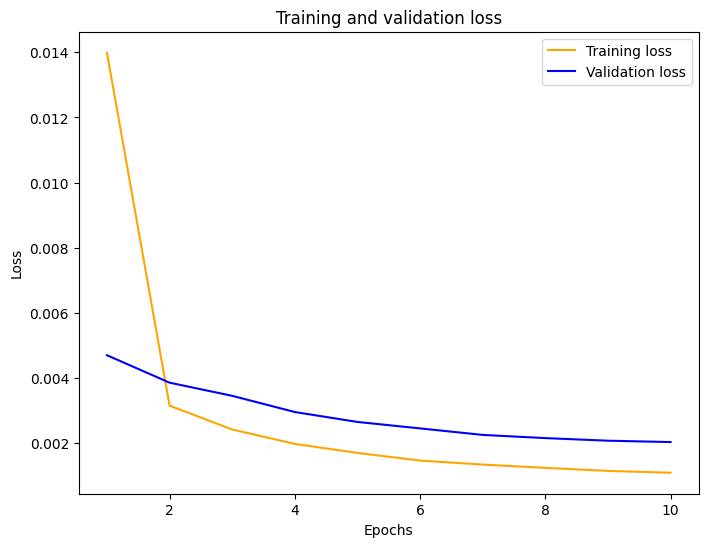

In [23]:
plot_curve(hist_adam)

In [24]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.559184
1,2021-12-10 15:25:00,0.588,0.541901
2,2021-12-10 15:26:00,0.566,0.580693
3,2021-12-10 15:27:00,0.562,0.580805
4,2021-12-10 15:28:00,0.612,0.568898
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087
3009,2021-12-16 13:59:00,0.169,0.171547
3010,2021-12-16 14:00:00,0.147,0.171989
3011,2021-12-16 14:01:00,0.145,0.157864


In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [26]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.002021276590446804

In [27]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','mse error'])

data = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_adam}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\2063346586.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [28]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 13ms/step - loss: 0.0053 - val_loss: 0.0028
Epoch 2/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_l

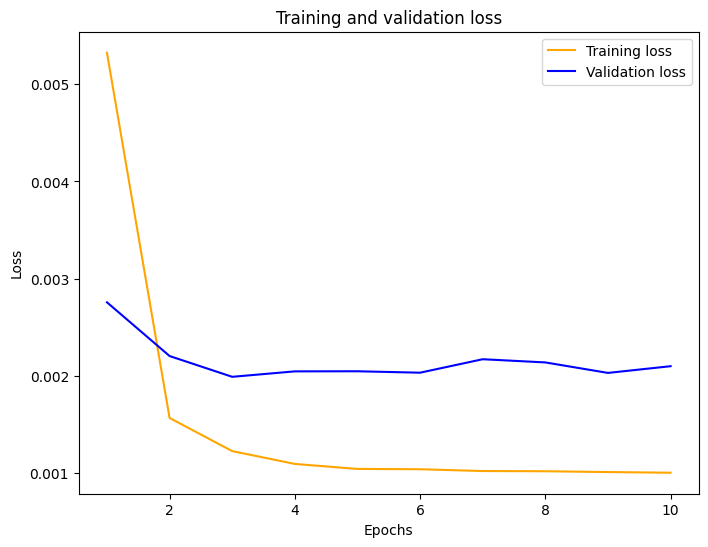

In [29]:
plot_curve(hist_50_rms)

In [30]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.559184,0.559731
1,2021-12-10 15:25:00,0.588,0.541901,0.543606
2,2021-12-10 15:26:00,0.566,0.580693,0.596399
3,2021-12-10 15:27:00,0.562,0.580805,0.574329
4,2021-12-10 15:28:00,0.612,0.568898,0.569396
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.171648
3009,2021-12-16 13:59:00,0.169,0.171547,0.171509
3010,2021-12-16 14:00:00,0.147,0.171989,0.172469
3011,2021-12-16 14:01:00,0.145,0.157864,0.151718


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002089


In [33]:
data1 = [{'Lags':20 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\3134983377.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [34]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
188/188 [==============================] - 9s 20ms/step - loss: 0.0166 - val_loss: 0.0045
Epoch 2/10
188/188 [==============================] - 3s 18ms/step - loss: 0.0033 - val_loss: 0.0039
Epoch 3/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0027 - val_loss: 0.0035
Epoch 4/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0023 - val_loss: 0.0032
Epoch 5/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 6/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 7/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 8/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 9/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 10/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0014 - val_lo

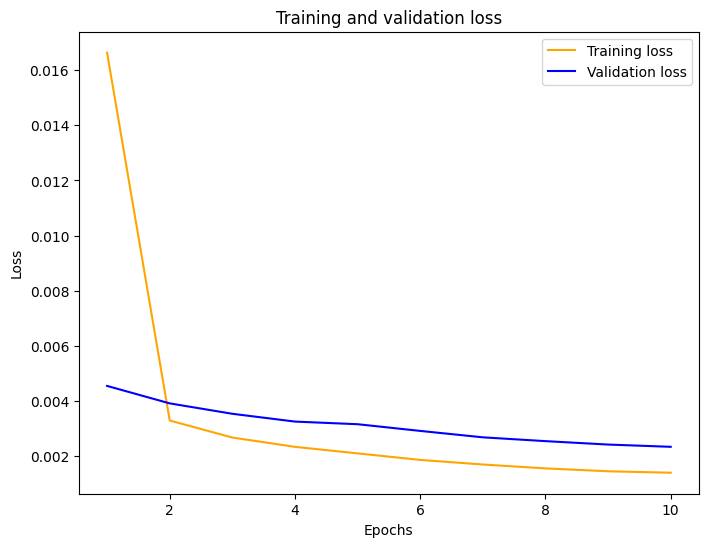

In [35]:
plot_curve(hist_batch_size64)

In [36]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.559184,0.559731,0.576852
1,2021-12-10 15:25:00,0.588,0.541901,0.543606,0.547850
2,2021-12-10 15:26:00,0.566,0.580693,0.596399,0.560866
3,2021-12-10 15:27:00,0.562,0.580805,0.574329,0.565383
4,2021-12-10 15:28:00,0.612,0.568898,0.569396,0.567135
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.171648,0.172811
3009,2021-12-16 13:59:00,0.169,0.171547,0.171509,0.172460
3010,2021-12-16 14:00:00,0.147,0.171989,0.172469,0.172690
3011,2021-12-16 14:01:00,0.145,0.157864,0.151718,0.164472


In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [38]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002319


In [39]:
data2 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\826055456.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319


---

### learning rate 0.1

In [40]:
test2 = test.copy()

#### Add frist layer: units = 50

In [41]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 13ms/step - loss: 0.1452 - val_loss: 0.0057
Epoch 2/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0015 - val_loss: 0.0032
Epoch 6/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0015 - val_loss: 0.0057
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0059 - val_loss: 0.0025
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0012 - val_lo

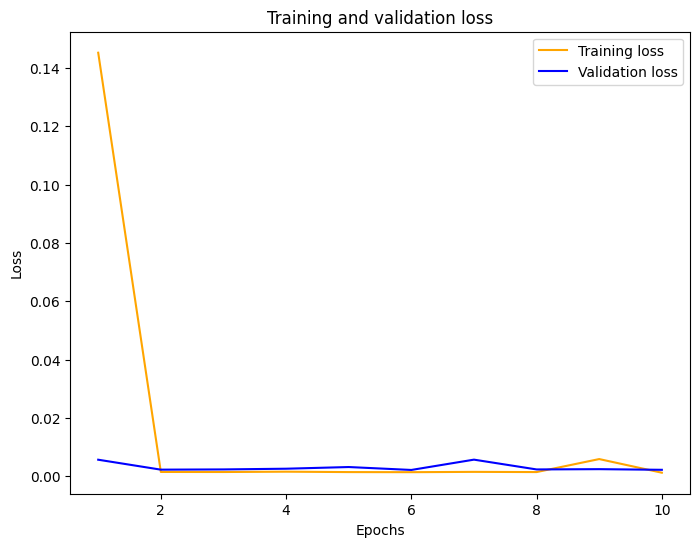

In [42]:
plot_curve(hist_01)

In [43]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.549477
1,2021-12-10 15:25:00,0.588,0.537027
2,2021-12-10 15:26:00,0.566,0.598791
3,2021-12-10 15:27:00,0.562,0.566648
4,2021-12-10 15:28:00,0.612,0.560467
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169605
3009,2021-12-16 13:59:00,0.169,0.169848
3010,2021-12-16 14:00:00,0.147,0.171276
3011,2021-12-16 14:01:00,0.145,0.143854


In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [45]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002222


In [46]:
data3 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\1192896914.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [47]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 13ms/step - loss: 0.1033 - val_loss: 0.0038
Epoch 2/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0028 - val_loss: 0.0022
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0023 - val_loss: 0.0027
Epoch 5/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0028 - val_loss: 0.0079
Epoch 6/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0032 - val_loss: 0.0030
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0038 - val_loss: 0.0029
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0031 - val_loss: 0.0038
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0028 - val_l

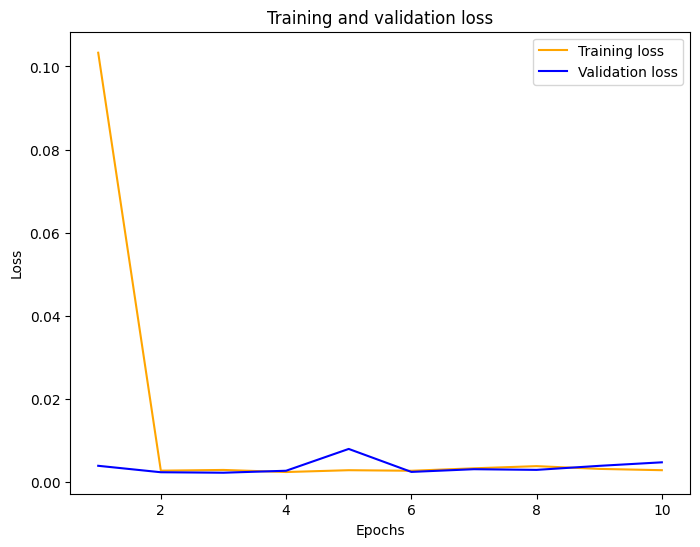

In [48]:
plot_curve(hist_005)

In [49]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.549477,0.509914
1,2021-12-10 15:25:00,0.588,0.537027,0.489379
2,2021-12-10 15:26:00,0.566,0.598791,0.561582
3,2021-12-10 15:27:00,0.562,0.566648,0.517887
4,2021-12-10 15:28:00,0.612,0.560467,0.520761
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169605,0.104019
3009,2021-12-16 13:59:00,0.169,0.169848,0.104572
3010,2021-12-16 14:00:00,0.147,0.171276,0.105526
3011,2021-12-16 14:01:00,0.145,0.143854,0.082226


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [51]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.004660


In [52]:
data4 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\600055413.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [53]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 13ms/step - loss: 0.0043 - val_loss: 0.0025
Epoch 2/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_l

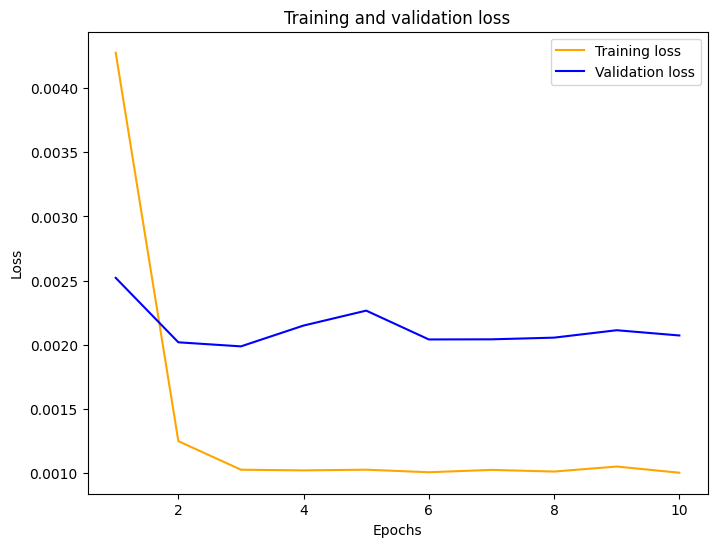

In [54]:
plot_curve(hist_001)

In [55]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.549477,0.509914,0.549854
1,2021-12-10 15:25:00,0.588,0.537027,0.489379,0.531220
2,2021-12-10 15:26:00,0.566,0.598791,0.561582,0.583754
3,2021-12-10 15:27:00,0.562,0.566648,0.517887,0.555714
4,2021-12-10 15:28:00,0.612,0.560467,0.520761,0.555297
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169605,0.104019,0.159921
3009,2021-12-16 13:59:00,0.169,0.169848,0.104572,0.160011
3010,2021-12-16 14:00:00,0.147,0.171276,0.105526,0.160986
3011,2021-12-16 14:01:00,0.145,0.143854,0.082226,0.138817


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002062


In [58]:
data = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\1065818162.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [59]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 13ms/step - loss: 0.0051 - val_loss: 0.0029
Epoch 2/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 4s 10ms/step - loss: 9.8917e-04 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 9.6996e-04 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 4s 11ms/step - loss: 9.9368e-04 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0

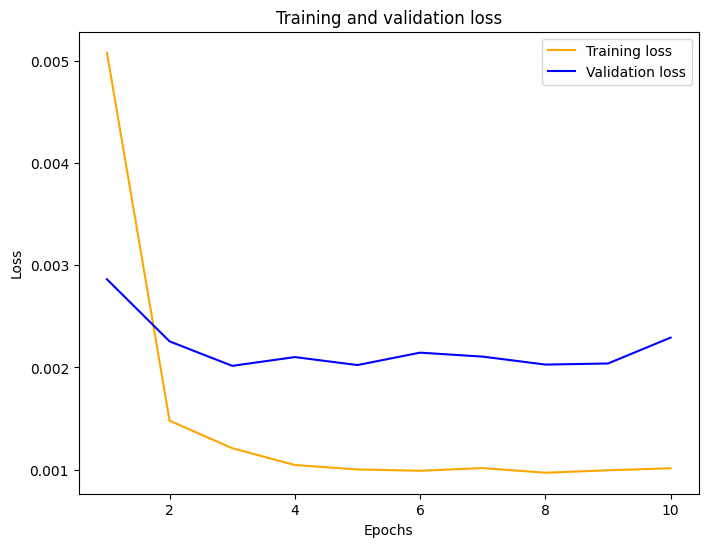

In [60]:
plot_curve(hist_0005)

In [61]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.549477,0.509914,0.549854,0.534173
1,2021-12-10 15:25:00,0.588,0.537027,0.489379,0.531220,0.517827
2,2021-12-10 15:26:00,0.566,0.598791,0.561582,0.583754,0.572555
3,2021-12-10 15:27:00,0.562,0.566648,0.517887,0.555714,0.544665
4,2021-12-10 15:28:00,0.612,0.560467,0.520761,0.555297,0.542348
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169605,0.104019,0.159921,0.156107
3009,2021-12-16 13:59:00,0.169,0.169848,0.104572,0.160011,0.155971
3010,2021-12-16 14:00:00,0.147,0.171276,0.105526,0.160986,0.156955
3011,2021-12-16 14:01:00,0.145,0.143854,0.082226,0.138817,0.136270


In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [63]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002280


In [64]:
data5 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\4014177811.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [65]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 8s 11ms/step - loss: 0.0074 - val_loss: 0.0037
Epoch 2/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0023 - val_loss: 0.0031
Epoch 3/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 5/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0

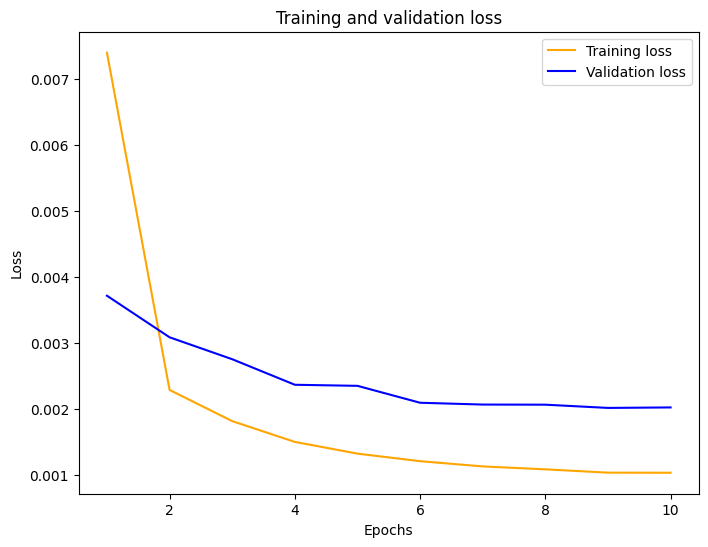

In [66]:
plot_curve(hist_0001)

In [67]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.549477,0.509914,0.549854,0.534173,0.549854
1,2021-12-10 15:25:00,0.588,0.537027,0.489379,0.531220,0.517827,0.531220
2,2021-12-10 15:26:00,0.566,0.598791,0.561582,0.583754,0.572555,0.583754
3,2021-12-10 15:27:00,0.562,0.566648,0.517887,0.555714,0.544665,0.555714
4,2021-12-10 15:28:00,0.612,0.560467,0.520761,0.555297,0.542348,0.555297
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.169605,0.104019,0.159921,0.156107,0.159921
3009,2021-12-16 13:59:00,0.169,0.169848,0.104572,0.160011,0.155971,0.160011
3010,2021-12-16 14:00:00,0.147,0.171276,0.105526,0.160986,0.156955,0.160986
3011,2021-12-16 14:01:00,0.145,0.143854,0.082226,0.138817,0.136270,0.138817


In [68]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [69]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.002021276590446804


,Model,MSE error
0,model,0.002021
1,model_1,0.002062


In [70]:
data6 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\3376395076.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [71]:
test3 = test.copy()

In [72]:
test3['LSTM_50'] = predict_adam

In [73]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 19ms/step - loss: 0.0072 - val_loss: 0.0037
Epoch 2/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0022 - val_loss: 0.0029
Epoch 3/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 4/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 5/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 6s 17ms/step - loss: 9.8559e-04 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 6s 15ms/step - loss: 9.7386e-04

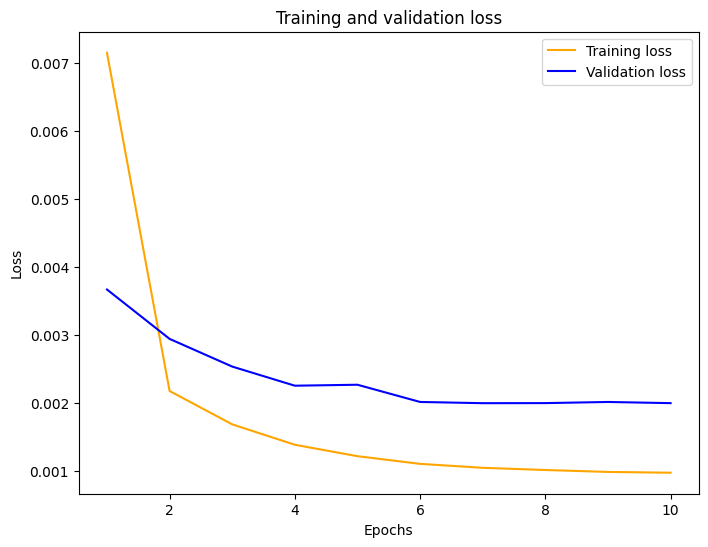

In [74]:
plot_curve(hist_1)

In [75]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.559184,0.552079
1,2021-12-10 15:25:00,0.588,0.541901,0.536208
2,2021-12-10 15:26:00,0.566,0.580693,0.585782
3,2021-12-10 15:27:00,0.562,0.580805,0.561207
4,2021-12-10 15:28:00,0.612,0.568898,0.556851
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.167656
3009,2021-12-16 13:59:00,0.169,0.171547,0.167409
3010,2021-12-16 14:00:00,0.147,0.171989,0.168293
3011,2021-12-16 14:01:00,0.145,0.157864,0.149048


In [76]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [77]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.0019875960201027154


,Model,MSE error
0,model,0.002021
1,model_1,0.001988


In [78]:
data7 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\3894274306.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062
8,20,Adam,32,,100,,,,,1,10,0.001988


------------

### Add frist layer: units = 100 and Add Dropout = 0.1

In [79]:
model_2 = Sequential()
model_2.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 21ms/step - loss: 0.0097 - val_loss: 0.0039
Epoch 2/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0031 - val_loss: 0.0032
Epoch 3/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0025 - val_loss: 0.0030
Epoch 4/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0022 - val_loss: 0.0026
Epoch 5/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 6/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0017 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0014 - val_l

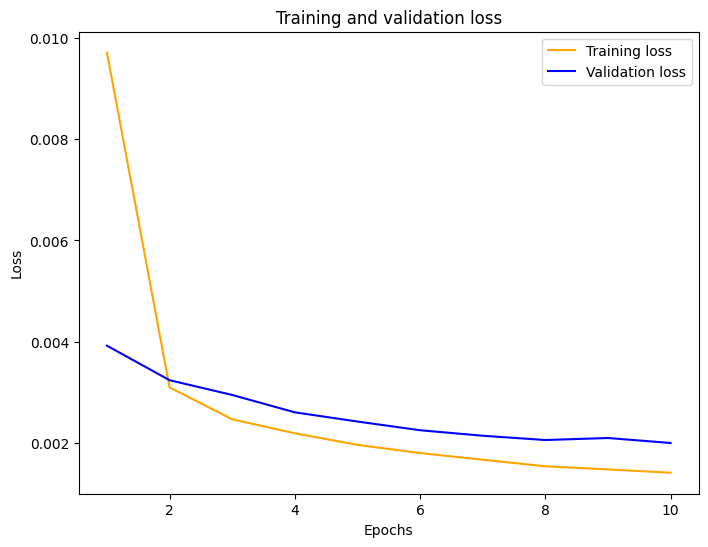

In [80]:
plot_curve(hist_2)

In [81]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.559184,0.552079,0.552167
1,2021-12-10 15:25:00,0.588,0.541901,0.536208,0.536886
2,2021-12-10 15:26:00,0.566,0.580693,0.585782,0.578570
3,2021-12-10 15:27:00,0.562,0.580805,0.561207,0.568547
4,2021-12-10 15:28:00,0.612,0.568898,0.556851,0.558418
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.167656,0.166818
3009,2021-12-16 13:59:00,0.169,0.171547,0.167409,0.166302
3010,2021-12-16 14:00:00,0.147,0.171989,0.168293,0.166852
3011,2021-12-16 14:01:00,0.145,0.157864,0.149048,0.151811


In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [83]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_100_drop_out)

Better MSE value is :  0.0019875960201027154


,Model,MSE error
0,model,0.001988
1,model_1,0.001997


In [84]:
data8 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_100_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\4263203069.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062
8,20,Adam,32,,100,,,,,1,10,0.001988
9,20,Adam,32,,100,0.1,,,,1,10,0.001997


------------------------------------

### Add frist layer: units = 100 and Add second layer: unit = 50

In [85]:
model_3 = Sequential()
model_3.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 20s 28ms/step - loss: 0.0068 - val_loss: 0.0038
Epoch 2/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0023 - val_loss: 0.0031
Epoch 3/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 10s 27ms/step - loss: 9.9374e-04 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 13s 33ms/step - loss: 9.8946e-

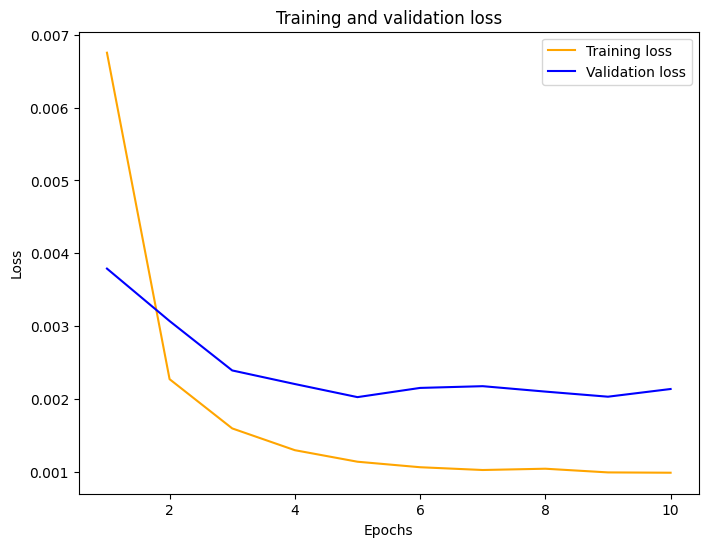

In [86]:
plot_curve(hist_3)

In [87]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 3s 12ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.559184,0.552079,0.552167,0.557286
1,2021-12-10 15:25:00,0.588,0.541901,0.536208,0.536886,0.540585
2,2021-12-10 15:26:00,0.566,0.580693,0.585782,0.578570,0.592888
3,2021-12-10 15:27:00,0.562,0.580805,0.561207,0.568547,0.568701
4,2021-12-10 15:28:00,0.612,0.568898,0.556851,0.558418,0.565253
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.167656,0.166818,0.182199
3009,2021-12-16 13:59:00,0.169,0.171547,0.167409,0.166302,0.181928
3010,2021-12-16 14:00:00,0.147,0.171989,0.168293,0.166852,0.182787
3011,2021-12-16 14:01:00,0.145,0.157864,0.149048,0.151811,0.164522


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_second_layer)

Better MSE value is :  0.0019875960201027154


,Model,MSE error
0,model,0.001988
1,model_1,0.002127


In [90]:
data10 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\1792472832.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062
8,20,Adam,32,,100,,,,,1,10,0.001988
9,20,Adam,32,,100,0.1,,,,1,10,0.001997


---

### Add frist layer: units = 100 and change epochs from 10 to 20

In [91]:
model_5 = Sequential()
model_5.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
376/376 [==============================] - 16s 27ms/step - loss: 0.0085 - val_loss: 0.0040
Epoch 2/20
376/376 [==============================] - 7s 19ms/step - loss: 0.0025 - val_loss: 0.0032
Epoch 3/20
376/376 [==============================] - 6s 17ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 4/20
376/376 [==============================] - 7s 19ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 5/20
376/376 [==============================] - 7s 19ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 6/20
376/376 [==============================] - 7s 19ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/20
376/376 [==============================] - 8s 20ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/20
376/376 [==============================] - 7s 20ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/20
376/376 [==============================] - 7s 19ms/step - loss: 9.7300e-04 - val_loss: 0.0020
Epoch 10/20
376/376 [==============================] - 7s 20ms/step - loss: 9.5543e-04

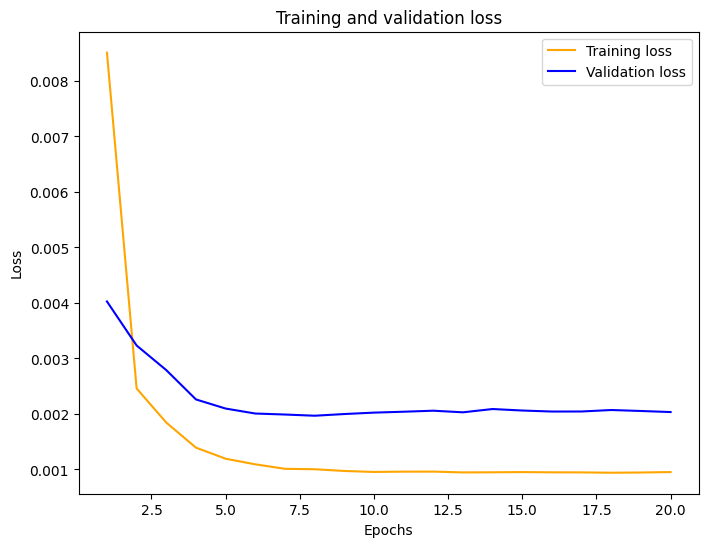

In [92]:
plot_curve(hist_5)

In [93]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.559184,0.552079,0.552167,0.557286,0.555646
1,2021-12-10 15:25:00,0.588,0.541901,0.536208,0.536886,0.540585,0.537902
2,2021-12-10 15:26:00,0.566,0.580693,0.585782,0.578570,0.592888,0.590866
3,2021-12-10 15:27:00,0.562,0.580805,0.561207,0.568547,0.568701,0.563324
4,2021-12-10 15:28:00,0.612,0.568898,0.556851,0.558418,0.565253,0.561632
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172087,0.167656,0.166818,0.182199,0.164935
3009,2021-12-16 13:59:00,0.169,0.171547,0.167409,0.166302,0.181928,0.164927
3010,2021-12-16 14:00:00,0.147,0.171989,0.168293,0.166852,0.182787,0.165898
3011,2021-12-16 14:01:00,0.145,0.157864,0.149048,0.151811,0.164522,0.144624


In [94]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [95]:
lstm_mse_error_unit_100_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_unit_100_epoch20)

Better MSE value is :  0.0019875960201027154


,Model,MSE error
0,model,0.001988
1,model_1,0.002024


In [96]:
data11 = [{'Lags':20 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_100_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8528\4066334117.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062
8,20,Adam,32,,100,,,,,1,10,0.001988
9,20,Adam,32,,100,0.1,,,,1,10,0.001997


---

# save model

In [97]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')
mse_lstm

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [98]:
mse_data

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,20,Adam,32,,50,,,,,1,10,0.002021
1,20,RMSprop,32,,50,,,,,1,10,0.002089
2,20,Adam,64,,50,,,,,1,10,0.002319
3,20,Adam,32,0.1,50,,,,,1,10,0.002222
4,20,Adam,32,0.05,50,,,,,1,10,0.004660
5,20,Adam,32,0.01,50,,,,,1,10,0.002062
6,20,Adam,32,0.005,50,,,,,1,10,0.002280
7,20,Adam,32,0.001,50,,,,,1,10,0.002062
8,20,Adam,32,,100,,,,,1,10,0.001988
9,20,Adam,32,,100,0.1,,,,1,10,0.001997


In [99]:
mse_lags = pd.concat([mse_lstm,mse_data],ignore_index=True)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.01,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [100]:
mse_lags.to_csv('data_lstm_mse.csv',index=False)

In [101]:
mse_lstm1 = pd.read_csv('data_lstm_mse.csv')
mse_lstm1

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [102]:
mse = mse_lstm1.groupby(['Lags'])['mse error'].transform(min) == mse_lstm1['mse error']
mse_lstm1[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987
13,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002009
33,15,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001995
45,20,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001988


In [103]:
model_1.save('model_train_80%_lag20.h5')